<a href="https://colab.research.google.com/github/IVK19/CV/blob/main/Brand_Data1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Первичный анализ и обработка данных

In [ ]:
!pip install dask[dataframe]

INFO: pip is looking at multiple versions of dask-expr to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.2/243.2 kB 4.1 MB/s eta 0:00:00


In [ ]:
# Загрузим данные
import numpy as np
import pandas as pd

df = pd.read_csv('test_brand_data.csv')
df

,date,brand,region,total_sales,total_items_count,total_receipts_count,total_stores_count
0,2027-02-06,Словора,Москва,2679000.97,23299,20085,927
1,2027-01-02,Зефора,Москва,2567184.96,19403,16886,855
2,2027-02-27,Словора,Москва,2869078.09,22382,19289,932
3,2027-01-02,Каморн,Москва,2899584.85,26983,23316,932
4,2027-01-02,Словора,Москва,4758714.46,51520,42814,927
...,...,...,...,...,...,...,...
50066,2028-05-27,Зефора,Ярославская область,2890245.22,27727,24294,191
50067,2028-05-27,Линдо,Ярославская область,195.37,1,1,1
50068,2028-05-27,Каморн,Ярославская область,456623.22,3566,3088,191
50069,2028-05-27,Люнга,Ярославская область,380131.24,5688,4915,119


In [ ]:
# В данных отсутствует информация о названии 8 брендов
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50071 entries, 0 to 50070
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   date                  50071 non-null  object 
 1   brand                 50063 non-null  object 
 2   region                50071 non-null  object 
 3   total_sales           50071 non-null  float64
 4   total_items_count     50071 non-null  int64  
 5   total_receipts_count  50071 non-null  int64  
 6   total_stores_count    50071 non-null  int64  
dtypes: float64(1), int64(3), object(3)
memory usage: 2.7+ MB


In [ ]:
# Приведём поле 'date' к формату datetime и отсортируем данные по брендам, регионам и дате
df['date'] = pd.to_datetime(df['date'])
df = df.sort_values(['brand', 'region', 'date'])
df.tail(10)

,date,brand,region,total_sales,total_items_count,total_receipts_count,total_stores_count
49335,2028-05-20,Шортиль,Хабаровский край,222424.67,4364,3316,66
50022,2028-05-27,Шортиль,Хабаровский край,209010.94,4428,3295,67
44716,2028-04-08,NaN,Кировская область,8373.59,63,55,32
45412,2028-04-15,NaN,Кировская область,83829.97,705,617,120
46099,2028-04-22,NaN,Кировская область,111786.40,983,856,124
46791,2028-04-29,NaN,Кировская область,127729.01,1128,988,126
47482,2028-05-06,NaN,Кировская область,127119.16,1120,960,127
48173,2028-05-13,NaN,Кировская область,109536.45,962,833,124
48863,2028-05-20,NaN,Кировская область,115168.19,1021,893,122
49559,2028-05-27,NaN,Кировская область,112858.62,1000,867,124


In [ ]:
# Извлечём данные о дне, месяце и годе в отдельные поля
df['day'] = df['date'].dt.day.astype('int64')
df['month'] = df['date'].dt.month.astype('int64')
df['year'] = df['date'].dt.year.astype('int64')

In [ ]:
# Заполним отсутствующие названия брендов прочерками
df = df.fillna('-')

# Общий анализ данных

In [ ]:
# Изучим итоговые графики продаж брендов, чтобы выбрать один из них для дальнейших исследований
# Среди брендов один из наименее волатильных, демонстрирующих умеренный рост и заслуживащих доверие, - это Доверан
# Выберем Доверан для дальнейших исследований
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import plotly.colors as colors

for brand in df['brand'].unique():
    brand_ts = df.loc[df['brand'] == brand].groupby('date')['total_sales'].sum().reset_index()
    if brand_ts.empty:
        continue

    fig = px.line(brand_ts,
                    x='date',
                    y='total_sales',
                    color_discrete_sequence=colors.qualitative.Plotly,
                    labels={'total_sales': 'Продажи', 'date': 'Дата'},
                    title=f'Продажи бренда "{brand}"')

    fig.update_layout(template='plotly_dark')

    fig.show()

In [ ]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import plotly.colors as colors

for brand in df['brand'].unique():
    for region in df['region'].unique():
        brand_region_ts = df.loc[(df['brand'] == brand) & (df['region'] == region)][['date', 'total_sales']]
        if brand_region_ts.empty:
            continue
        fig = px.line(brand_region_ts,
                    x='date',
                    y='total_sales',
                    color_discrete_sequence=colors.qualitative.Plotly,
                    labels={'total_sales': 'Продажи', 'date': 'Дата'},
                    title=f'Продажи бренда "{brand}" в регионе: {region}')

        fig.update_layout(template='plotly_dark')

        fig.show()

In [ ]:
# Получим список уникальных брендов
df['brand'].unique()

array(['Брефора', 'Бривел', 'Вельмер', 'Венжера', 'Вунтель', 'Гирба',
       'Гондель', 'Гренто', 'Гробур', 'Гроталь', 'Доверан', 'Жантель',
       'Зефора', 'Каморн', 'Кларим', 'Корманис', 'Красталь', 'Кримора',
       'Кроча', 'Ладеран', 'Ламбус', 'Линдо', 'Люнга', 'Меривир',
       'Мурдело', 'Набрия', 'Прандир', 'Скалон', 'Словора', 'Траммель',
       'Трандус', 'Урлика', 'Урмель', 'Фландер', 'Фридлос', 'Фрингель',
       'Хантир', 'Хмедон', 'Хонгор', 'Шалтан', 'Шамор', 'Шортиль', '-'],
      dtype=object)

In [ ]:
# Получим список уникальных регионов, в которых продаются перечисленные выше бренды
df['region'].unique()

array(['Алтайский край', 'Иркутская область', 'Кемеровская область',
       'Красноярский край', 'Новосибирская область', 'Омская область',
       'Республика Алтай', 'Томская область', 'Архангельская область',
       'Астраханская область', 'Белгородская область', 'Брянская область',
       'Владимирская область', 'Волгоградская область',
       'Вологодская область', 'Воронежская область', 'Забайкальский край',
       'Ивановская область', 'Кабардино-Балкарская Республика',
       'Калининградская область', 'Калужская область',
       'Карачаево-Черкесская Республика', 'Кировская область',
       'Костромская область', 'Краснодарский край', 'Курганская область',
       'Курская область', 'Ленинградская область', 'Липецкая область',
       'Москва', 'Московская область', 'Мурманская область',
       'Нижегородская область', 'Новгородская область',
       'Оренбургская область', 'Орловская область', 'Пензенская область',
       'Пермский край', 'Псковская область', 'Республика Адыгея (

In [ ]:
# Для каждого бренда запросим список регионов его продажи и посчитаем регионы
# Наибольший охват вклчает в себя 71 регион, Доверан продавался только в 22 регионах
for brand in df['brand'].unique():
    print('*'*72)
    print(brand, df.loc[df['brand']==brand]['region'].unique(), len(df.loc[df['brand']==brand]['region'].unique()))

************************************************************************
Брефора ['Алтайский край' 'Иркутская область' 'Кемеровская область'
 'Красноярский край' 'Новосибирская область' 'Омская область'
 'Республика Алтай' 'Томская область'] 8
************************************************************************
Бривел ['Алтайский край' 'Архангельская область' 'Астраханская область'
 'Белгородская область' 'Брянская область' 'Владимирская область'
 'Волгоградская область' 'Вологодская область' 'Воронежская область'
 'Забайкальский край' 'Ивановская область' 'Иркутская область'
 'Кабардино-Балкарская Республика' 'Калининградская область'
 'Калужская область' 'Карачаево-Черкесская Республика'
 'Кемеровская область' 'Кировская область' 'Костромская область'
 'Краснодарский край' 'Красноярский край' 'Курганская область'
 'Курская область' 'Ленинградская область' 'Липецкая область' 'Москва'
 'Московская область' 'Мурманская область' 'Нижегородская область'
 'Новгородская область' 'Новоси

In [ ]:
brand_lst = []
region_lst = []
len_ts = []
start_dt = []
stop_dt = []

for brand in df['brand'].unique():
    for region in df['region'].unique():
        brand_region_ts = df.loc[(df['brand'] == brand) & (df['region'] == region)]
        brand_lst.append(brand)
        region_lst.append(region)
        len_ts.append(len(brand_region_ts))

        if len(brand_region_ts) == 0:
            start_dt.append(0)
            stop_dt.append(0)
        else:
            start_dt.append(brand_region_ts['date'].iloc[0])
            stop_dt.append(brand_region_ts['date'].iloc[-1])

ts_len = pd.DataFrame({'brand': brand_lst, 'region': region_lst, 'sales_len': len_ts, 'first_date': start_dt, 'last_date': stop_dt})
ts_len

,brand,region,sales_len,first_date,last_date
0,Брефора,Алтайский край,53,2027-03-06 00:00:00,2028-05-20 00:00:00
1,Брефора,Иркутская область,3,2027-09-25 00:00:00,2027-10-16 00:00:00
2,Брефора,Кемеровская область,54,2027-01-02 00:00:00,2028-05-27 00:00:00
3,Брефора,Красноярский край,12,2027-09-11 00:00:00,2027-11-27 00:00:00
4,Брефора,Новосибирская область,74,2027-01-02 00:00:00,2028-05-27 00:00:00
...,...,...,...,...,...
3048,-,Чувашская Республика - Чувашия,0,0,0
3049,-,Ямало-Ненецкий автономный округ,0,0,0
3050,-,Ярославская область,0,0,0
3051,-,Приморский край,0,0,0


In [ ]:
# В некоторых регионах информация о продажах некоторых брендов крайне скудна
# В дальнейшем для задач исследования информация о продажах продолжительностью менее двух месяцев рассматриваться не будет
ts_len.loc[ts_len['sales_len']>0].sort_values('sales_len', ascending=False)

,brand,region,sales_len,first_date,last_date
1096,Корманис,Мурманская область,74,2027-01-02 00:00:00,2028-05-27 00:00:00
1112,Корманис,Республика Северная Осетия — Алания,74,2027-01-02 00:00:00,2028-05-27 00:00:00
1105,Корманис,Республика Башкортостан,74,2027-01-02 00:00:00,2028-05-27 00:00:00
1106,Корманис,Республика Калмыкия,74,2027-01-02 00:00:00,2028-05-27 00:00:00
1107,Корманис,Республика Карелия,74,2027-01-02 00:00:00,2028-05-27 00:00:00
...,...,...,...,...,...
1148,Красталь,Владимирская область,1,2027-07-17 00:00:00,2027-07-17 00:00:00
2613,Хантир,Ставропольский край,1,2028-01-15 00:00:00,2028-01-15 00:00:00
742,Доверан,Нижегородская область,1,2027-09-18 00:00:00,2027-09-18 00:00:00
2046,Словора,Тамбовская область,1,2027-10-02 00:00:00,2027-10-02 00:00:00


# Извлечение данных по продажам Доверана и его конкурентов, сгруппированных по регионам их совместной продажи

In [ ]:
# Получим списки регионов продаж и конкурентов Доверана
drs = df.loc[df['brand']=='Доверан']['region'].unique()
dcs = df.loc[(df['region'].isin(drs))&(df['brand']!='Доверан')]['brand'].unique()

print(drs)
print(dcs)

['Архангельская область' 'Вологодская область' 'Ивановская область'
 'Калининградская область' 'Кировская область' 'Костромская область'
 'Ленинградская область' 'Московская область' 'Мурманская область'
 'Нижегородская область' 'Новгородская область' 'Оренбургская область'
 'Пермский край' 'Псковская область' 'Республика Башкортостан'
 'Республика Карелия' 'Республика Коми' 'Республика Марий Эл'
 'Республика Татарстан (Татарстан)' 'Санкт-Петербург'
 'Удмуртская Республика' 'Ярославская область']
['Бривел' 'Вельмер' 'Гренто' 'Гробур' 'Гроталь' 'Зефора' 'Каморн'
 'Корманис' 'Красталь' 'Кримора' 'Кроча' 'Линдо' 'Люнга' 'Меривир'
 'Скалон' 'Словора' 'Урлика' 'Фландер' 'Фрингель' 'Хантир' 'Хмедон'
 'Шалтан' 'Шамор' '-']


In [ ]:
# Извлечём данные о продажах Доверана продолжительностью более 2-х месяцев
# Добавим данные о скользящей средней и скользящей дисперсии за 4 временных единицы наблюдений (наблюдения еженедельны)
dts = []
regs = []
for region in drs:
    sales = df.loc[(df['brand']=='Доверан')&(df['region']==region)]
    if len(sales) >= 8:
        sales['rolling_mean4_sales'] = sales.groupby(['brand', 'region'])['total_sales'].transform(lambda x: x.rolling(window=4).mean())
        sales['rolling_std4_sales'] = sales.groupby(['brand', 'region'])['total_sales'].transform(lambda x: x.rolling(window=4).std())
        dts.append(sales)
        regs.append(region)

<ipython-input-20-3ab96a6c8e53>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-20-3ab96a6c8e53>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-20-3ab96a6c8e53>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-20-3ab96a6

In [ ]:
# Выберем данные по конкурентам Доверана, совпадащие с ним по регионам и датам продаж
cts = []
for brand in dcs:
    for i, region in enumerate(regs):
        company = df.loc[(df['brand']==brand)&(df['region']==region)&(df['date'].isin(dts[i]['date']))]
        if len(company) == len(dts[i]):
            company['rolling_mean4_sales'] = company.groupby(['brand', 'region'])['total_sales'].transform(lambda x: x.rolling(window=4).mean())
            company['rolling_std4_sales'] = company.groupby(['brand', 'region'])['total_sales'].transform(lambda x: x.rolling(window=4).std())
            cts.append(company)

<ipython-input-21-a78b7652d72a>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-21-a78b7652d72a>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-21-a78b7652d72a>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-21-a78b765

In [ ]:
dts.extend(cts)
len(dts)

191

In [ ]:
Doveran_and_competitors_data = pd.concat(dts)
Doveran_and_competitors_data

,date,brand,region,total_sales,total_items_count,total_receipts_count,total_stores_count,day,month,year,rolling_mean4_sales,rolling_std4_sales
21,2027-01-02,Доверан,Архангельская область,4750.37,41,36,6,2,1,2027,NaN,NaN
683,2027-01-09,Доверан,Архангельская область,8280.50,63,55,8,9,1,2027,NaN,NaN
1350,2027-01-16,Доверан,Архангельская область,4783.51,35,32,7,16,1,2027,NaN,NaN
2002,2027-01-23,Доверан,Архангельская область,4469.26,33,30,6,23,1,2027,5570.9100,1811.886249
2649,2027-01-30,Доверан,Архангельская область,7348.69,53,45,7,30,1,2027,6220.4900,1883.984649
...,...,...,...,...,...,...,...,...,...,...,...,...
47236,2028-04-29,Шамор,Удмуртская Республика,57711.97,680,600,91,29,4,2028,52297.5100,4781.109557
47924,2028-05-06,Шамор,Удмуртская Республика,55805.87,667,593,93,6,5,2028,54429.6500,3535.492597
48616,2028-05-13,Шамор,Удмуртская Республика,60394.21,735,658,91,13,5,2028,55842.1300,4654.592799
49309,2028-05-20,Шамор,Удмуртская Республика,69807.64,888,787,92,20,5,2028,60929.9225,6210.528378


In [ ]:
# Сохраним полученные данные для дальнейшей работы
Doveran_and_competitors_data.to_csv('doveran_data.csv', index=False)

In [ ]:
Doveran_and_competitors_data.brand.unique()

array(['Доверан', 'Бривел', 'Гробур', 'Гроталь', 'Зефора', 'Каморн',
       'Корманис', 'Кримора', 'Кроча', 'Линдо', 'Люнга', 'Словора',
       'Урлика', 'Фландер', 'Фрингель', 'Хмедон', 'Шамор'], dtype=object)

In [ ]:
# Получим суммарные данные о продажах Доверана и его конкурентов по всем регионам продаж (Доверана)
total_brand_sales = []

for brand in Doveran_and_competitors_data['brand'].unique():
    brand_ts = Doveran_and_competitors_data.loc[Doveran_and_competitors_data['brand'] == brand].groupby('date')['total_sales'].sum().reset_index()
    brand_ts['brand'] = brand
    if not brand_ts.empty:
        total_brand_sales.append(brand_ts)

total_brand_sales_df = pd.concat(total_brand_sales)
total_brand_sales_df.to_csv('total_brand_sales.csv', index=False)
total_brand_sales_df

,date,total_sales,brand
0,2027-01-02,2085116.98,Доверан
1,2027-01-09,2521227.45,Доверан
2,2027-01-16,2479400.93,Доверан
3,2027-01-23,2643755.04,Доверан
4,2027-01-30,2721166.79,Доверан
...,...,...,...
44,2028-04-29,57711.97,Шамор
45,2028-05-06,55805.87,Шамор
46,2028-05-13,60394.21,Шамор
47,2028-05-20,69807.64,Шамор


# Визуализация продаж Доверана и его конкурентов

In [ ]:
# Суммарно по продажам в своих регионах Доверан занял 6-е место
import plotly.graph_objects as go
import plotly.express as px

total_brand_sales_df['date'] = pd.to_datetime(total_brand_sales_df['date'])

df_Doveran = total_brand_sales_df.loc[total_brand_sales_df['brand']=='Доверан'][['brand', 'total_sales']]
df_Doveran = df_Doveran[['total_sales']].sum().reset_index()
df_Doveran['brand'] = 'Доверан'

brands = []
brands.append(df_Doveran)

for brand in total_brand_sales_df['brand'].unique()[1:]:
    df_brand = total_brand_sales_df.loc[total_brand_sales_df['brand']==brand][['brand', 'total_sales']]
    df_brand = df_brand[['total_sales']].sum().reset_index()
    df_brand['brand'] = brand
    brands.append(df_brand)

df_brands = pd.concat(brands)

df_brands = df_brands.rename(columns={0: 'total_sales'})

df_brands = df_brands.sort_values(['total_sales', 'brand'])

colors = px.colors.qualitative.Light24

fig = go.Figure()
for i, brand in enumerate(df_brands['brand'].unique()):

    filtered_df = df_brands[(df_brands['brand'] == brand)]

    x = [brand]
    y = filtered_df['total_sales'].values / 1000000

    fig.add_trace(go.Bar(
        x=x,
        y=y,
        name=brand,
        marker=dict(color=colors[i],
                    line=dict(color='black', width=1))
    ))

fig.update_layout(title='Итоговые продажи брендов',
                  xaxis_title='Месяцы', yaxis_title='Продажи (млн.шт.)',
                  barmode='group',
                  xaxis={'categoryorder':'total ascending'},
                  template='plotly_dark')

fig.show()

In [ ]:
# С января 2027 года по конец мая 2028 года по общим еженедельным продажам в своих регионах Доверан опустился с первого места на седьмое
# При этом объём продаж Доверана продолжал стабильно расти, однако стремительный рост продаж шести брендов оставил его позади
# Суммарно, исходя из объёма продаж и графиков их поведения, основными конкурентами Доверана являтся Гроталь, Корманис и Хмедон
import plotly.graph_objects as go
import plotly.express as px

colors = px.colors.qualitative.Light24

fig = go.Figure()
fig.add_trace(go.Scatter(
        x=total_brand_sales_df.loc[total_brand_sales_df['brand']=='Доверан']['date'],
        y=total_brand_sales_df.loc[total_brand_sales_df['brand']=='Доверан']['total_sales'],
        name='Доверан',
        mode='lines+markers',
        line=dict(color=colors[0]),
        marker=dict(symbol='star', size=10)))

for i, brand in enumerate(total_brand_sales_df.brand.unique()[1:]):
    fig.add_trace(go.Scatter(
        x=total_brand_sales_df.loc[total_brand_sales_df['brand']==brand]['date'],
        y=total_brand_sales_df.loc[total_brand_sales_df['brand']==brand]['total_sales'],
        name=brand,
        line=dict(color=colors[i])))

fig.update_layout(legend_orientation="h",
                    legend=dict(yanchor="top", y=1.03, xanchor="center", x=0.5),
                    title="Итоговые продажи брендов",
                    xaxis_title="Даты",
                    yaxis_title="Продажи",
                    margin=dict(l=0, r=10, t=30, b=10),
                    template='plotly_dark')
fig.show();

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 62.7 MB/s eta 0:00:00
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.8.0
    Uninstalling matplotlib-3.8.0:
      Successfully uninstalled matplotlib-3.8.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
plotnine 0.14.1 requires matplotlib>=3.8.0, but you have matplotlib 3.7.1 which is incompatible.


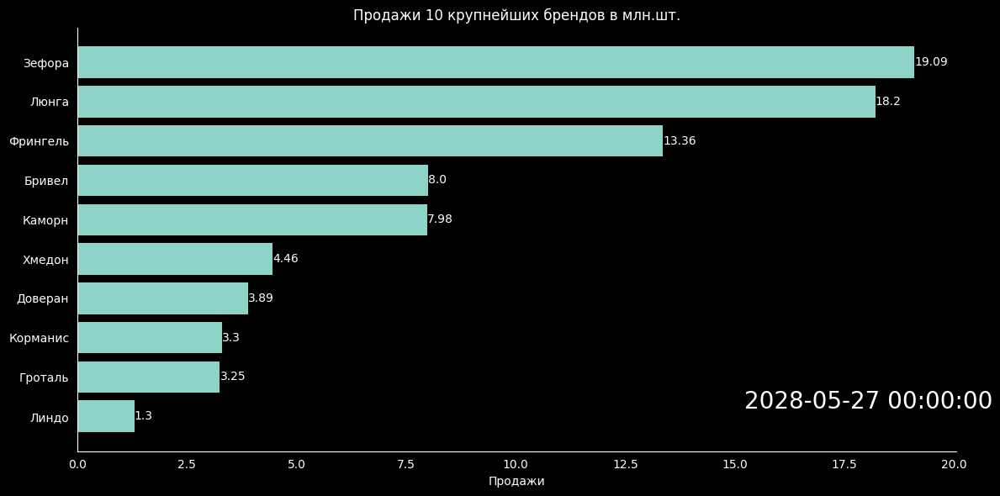

In [ ]:
# Анимированная гистограмма еженедельных продаж топ 10 брендов
!pip install matplotlib==3.7.1

import matplotlib.pyplot as plt
import matplotlib.animation as animation
plt.style.use('dark_background')

def set_up_plot_slyle(ax):

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.tick_params(axis='x', which='both', bottom=False)
    ax.tick_params(axis='y', which='both', left=False)
    ax.set_xlabel('Продажи')
    ax.set_title('Продажи 10 крупнейших брендов в млн.шт.')

def add_date(ax, date):
    ax.text(0.9, 0.1, str(date), transform=ax.transAxes, ha='center', fontsize=20)

def animation_bar(df):
    frames = df['date'].unique()

    fig, ax = plt.subplots(figsize=(12, 6))

    def animate(frame):
        ax.clear()
        data = df.loc[df['date'] == frame]
        top10_companies = data.nlargest(10, 'total_sales').sort_values('total_sales', ascending=True)
        ax.barh(top10_companies['brand'], top10_companies['total_sales'] / 1000000)
        for i, row in top10_companies.iterrows():
            ax.text(row['total_sales'] / 1000000, row['brand'], f'{round(row["total_sales"] / 1000000, 2)}', va='center')
        set_up_plot_slyle(ax)
        add_date(ax, frame)
        plt.tight_layout()

    anim = animation.FuncAnimation(fig, animate, frames=frames, interval=200)

    return anim

if __name__ == '__main__':
    anim = animation_bar(total_brand_sales_df)
    anim.save('sales_animation.gif', writer='Pillow', fps=1)
    plt.show()

In [ ]:
# Гистограмма суммарных месячных продаж за последний год наблюдений
# Максимальные продажи пришлись на декабрь, минимальные - на январь
import plotly.graph_objects as go
import plotly.express as px

total_brand_sales_df['date'] = pd.to_datetime(total_brand_sales_df['date'])
total_brand_sales_df['month'] = total_brand_sales_df['date'].dt.month

df_Doveran = total_brand_sales_df.loc[(total_brand_sales_df['brand']=='Доверан')&(total_brand_sales_df['date']>='2027-05-01')][['brand', 'month','total_sales']]
df_Doveran = df_Doveran.groupby('month')['total_sales'].sum().reset_index()
df_Doveran['brand'] = 'Доверан'

brands = []
brands.append(df_Doveran)

for brand in total_brand_sales_df['brand'].unique()[1:]:
    df_brand = total_brand_sales_df.loc[(total_brand_sales_df['brand']==brand)&(total_brand_sales_df['date']>='2027-05-01')][['brand', 'month','total_sales']]
    df_brand = df_brand.groupby('month')['total_sales'].sum().reset_index()
    df_brand['brand'] = brand
    brands.append(df_brand)

df_brands = pd.concat(brands)
df_brands = df_brands.sort_values(['total_sales', 'month', 'brand'])

months = ['Январь','Февраль','Март','Апрель','Май','Июнь','Июль','Август','Сентябрь','Октябрь','Ноябрь','Декабрь']

x_data = df_brands['month'].values
y_data = months

colors = px.colors.qualitative.Alphabet[3:]

fig = go.Figure()
for i, brand in enumerate(df_brands['brand'].unique()):

    filtered_df = df_brands[(df_brands['brand'] == brand)]

    x = [yd for xd, yd in zip(x_data, y_data) if xd in filtered_df['month'].values]
    y = filtered_df['total_sales'].values / 1000000

    fig.add_trace(go.Bar(
        x=x,
        y=y,
        name=brand,
        marker=dict(color=colors[i],
                    line=dict(color='black', width=1))
    ))

fig.update_layout(title='Продажи брендов по месяцам',
                  xaxis_title='Месяцы', yaxis_title='Продажи (млн.шт.)',
                  barmode='group',
                  xaxis={'categoryorder':'total ascending'},
                  template='plotly_dark')

fig.show()

# Визуализация регионального среза продаж Доверана и его конкурентов

In [ ]:
import numpy as np
import pandas as pd

Doveran_and_competitors_data = pd.read_csv('doveran_data.csv')
total_brand_sales_df = pd.read_csv('total_brand_sales.csv')
Doveran_and_competitors_data['date'] = pd.to_datetime(Doveran_and_competitors_data['date'])
total_brand_sales_df['date'] = pd.to_datetime(total_brand_sales_df['date'])

Doveran_and_competitors_data

,date,brand,region,total_sales,total_items_count,total_receipts_count,total_stores_count,day,month,year,rolling_mean4_sales,rolling_std4_sales
0,2027-01-02,Доверан,Архангельская область,4750.37,41,36,6,2,1,2027,NaN,NaN
1,2027-01-09,Доверан,Архангельская область,8280.50,63,55,8,9,1,2027,NaN,NaN
2,2027-01-16,Доверан,Архангельская область,4783.51,35,32,7,16,1,2027,NaN,NaN
3,2027-01-23,Доверан,Архангельская область,4469.26,33,30,6,23,1,2027,5570.9100,1811.886249
4,2027-01-30,Доверан,Архангельская область,7348.69,53,45,7,30,1,2027,6220.4900,1883.984649
...,...,...,...,...,...,...,...,...,...,...,...,...
9426,2028-04-29,Шамор,Удмуртская Республика,57711.97,680,600,91,29,4,2028,52297.5100,4781.109557
9427,2028-05-06,Шамор,Удмуртская Республика,55805.87,667,593,93,6,5,2028,54429.6500,3535.492597
9428,2028-05-13,Шамор,Удмуртская Республика,60394.21,735,658,91,13,5,2028,55842.1300,4654.592799
9429,2028-05-20,Шамор,Удмуртская Республика,69807.64,888,787,92,20,5,2028,60929.9225,6210.528378


In [ ]:
# На графиках регионального среза продаж наиболее отчётливо наблюдается тотальное господство Доверана в Кировской области
# В Республике Коми Доверан вырывается в тройку лидеров
# Также выявлено отсутствие данных по некоторым неделям продаж в Вологодской области, Оренбургской области, Республике Татарстан и Ярославской области
import plotly.graph_objects as go
import plotly.express as px

colors = px.colors.qualitative.Light24

for region in Doveran_and_competitors_data.region.unique():
    fig = go.Figure()
    fig.add_trace(go.Scatter(
            x=Doveran_and_competitors_data.loc[(Doveran_and_competitors_data['brand']=='Доверан')&(Doveran_and_competitors_data['region']==region)]['date'],
            y=Doveran_and_competitors_data.loc[(Doveran_and_competitors_data['brand']=='Доверан')&(Doveran_and_competitors_data['region']==region)]['total_sales'],
            name='Доверан',
            mode='lines+markers',
            line=dict(color=colors[0]),
            marker=dict(symbol='star', size=10)))

    for i, brand in enumerate(Doveran_and_competitors_data.loc[Doveran_and_competitors_data['region']==region].brand.unique()[1:]):
        fig.add_trace(go.Scatter(
            x=Doveran_and_competitors_data.loc[(Doveran_and_competitors_data['brand']==brand)&(Doveran_and_competitors_data['region']==region)]['date'],
            y=Doveran_and_competitors_data.loc[(Doveran_and_competitors_data['brand']==brand)&(Doveran_and_competitors_data['region']==region)]['total_sales'],
            name=brand,
            line=dict(color=colors[i])))

    fig.update_layout(legend_orientation="h",
                        legend=dict(yanchor="top", y=1.03, xanchor="center", x=0.5),
                        title=f"Продажи брендов в регионе: {region}",
                        xaxis_title="Даты",
                        yaxis_title="Продажи",
                        margin=dict(l=0, r=10, t=30, b=10),
                        template='plotly_dark')
    fig.show();

In [ ]:
# Региональный срез по ассортименту брендов примерно воспроизводит картину регионального среза продаж
import plotly.graph_objects as go
import plotly.express as px

colors = px.colors.qualitative.Light24

for region in Doveran_and_competitors_data.region.unique():
    fig = go.Figure()
    fig.add_trace(go.Scatter(
            x=Doveran_and_competitors_data.loc[(Doveran_and_competitors_data['brand']=='Доверан')&(Doveran_and_competitors_data['region']==region)]['date'],
            y=Doveran_and_competitors_data.loc[(Doveran_and_competitors_data['brand']=='Доверан')&(Doveran_and_competitors_data['region']==region)]['total_items_count'],
            name='Доверан',
            mode='lines+markers',
            line=dict(color=colors[0]),
            marker=dict(symbol='star', size=10)))

    for i, brand in enumerate(Doveran_and_competitors_data.loc[Doveran_and_competitors_data['region']==region].brand.unique()[1:]):
        fig.add_trace(go.Scatter(
            x=Doveran_and_competitors_data.loc[(Doveran_and_competitors_data['brand']==brand)&(Doveran_and_competitors_data['region']==region)]['date'],
            y=Doveran_and_competitors_data.loc[(Doveran_and_competitors_data['brand']==brand)&(Doveran_and_competitors_data['region']==region)]['total_items_count'],
            name=brand,
            line=dict(color=colors[i])))

    fig.update_layout(legend_orientation="h",
                        legend=dict(yanchor="top", y=1.03, xanchor="center", x=0.5),
                        title=f"Ассортимент брендов в регионе: {region}",
                        xaxis_title="Даты",
                        yaxis_title="Ассортимент",
                        margin=dict(l=0, r=10, t=30, b=10),
                        template='plotly_dark')
    fig.show();

In [ ]:
# Региональный срез по объёму заказов брендов аналогичен их продажам и ассортименту
import plotly.graph_objects as go
import plotly.express as px

colors = px.colors.qualitative.Light24

for region in Doveran_and_competitors_data.region.unique():
    fig = go.Figure()
    fig.add_trace(go.Scatter(
            x=Doveran_and_competitors_data.loc[(Doveran_and_competitors_data['brand']=='Доверан')&(Doveran_and_competitors_data['region']==region)]['date'],
            y=Doveran_and_competitors_data.loc[(Doveran_and_competitors_data['brand']=='Доверан')&(Doveran_and_competitors_data['region']==region)]['total_receipts_count'],
            name='Доверан',
            mode='lines+markers',
            line=dict(color=colors[0]),
            marker=dict(symbol='star', size=10)))

    for i, brand in enumerate(Doveran_and_competitors_data.loc[Doveran_and_competitors_data['region']==region].brand.unique()[1:]):
        fig.add_trace(go.Scatter(
            x=Doveran_and_competitors_data.loc[(Doveran_and_competitors_data['brand']==brand)&(Doveran_and_competitors_data['region']==region)]['date'],
            y=Doveran_and_competitors_data.loc[(Doveran_and_competitors_data['brand']==brand)&(Doveran_and_competitors_data['region']==region)]['total_receipts_count'],
            name=brand,
            line=dict(color=colors[i])))

    fig.update_layout(legend_orientation="h",
                        legend=dict(yanchor="top", y=1.03, xanchor="center", x=0.5),
                        title=f"Заказы брендов в регионе: {region}",
                        xaxis_title="Даты",
                        yaxis_title="Заказы",
                        margin=dict(l=0, r=10, t=30, b=10),
                        template='plotly_dark')
    fig.show();

In [ ]:
# По магазинам присутсвия в Кировской области Доверан за всё время наблюдений незначительно колеблется в районе 130
# Примечательно, что его ближайший конкурент по количеству магазинов - Каморн - заметно отстаёт по продажам
import plotly.graph_objects as go
import plotly.express as px

colors = px.colors.qualitative.Light24

for region in Doveran_and_competitors_data.region.unique():
    fig = go.Figure()
    fig.add_trace(go.Scatter(
            x=Doveran_and_competitors_data.loc[(Doveran_and_competitors_data['brand']=='Доверан')&(Doveran_and_competitors_data['region']==region)]['date'],
            y=Doveran_and_competitors_data.loc[(Doveran_and_competitors_data['brand']=='Доверан')&(Doveran_and_competitors_data['region']==region)]['total_stores_count'],
            name='Доверан',
            mode='lines+markers',
            line=dict(color=colors[0]),
            marker=dict(symbol='star', size=10)))

    for i, brand in enumerate(Doveran_and_competitors_data.loc[Doveran_and_competitors_data['region']==region].brand.unique()[1:]):
        fig.add_trace(go.Scatter(
            x=Doveran_and_competitors_data.loc[(Doveran_and_competitors_data['brand']==brand)&(Doveran_and_competitors_data['region']==region)]['date'],
            y=Doveran_and_competitors_data.loc[(Doveran_and_competitors_data['brand']==brand)&(Doveran_and_competitors_data['region']==region)]['total_stores_count'],
            name=brand,
            line=dict(color=colors[i])))

    fig.update_layout(legend_orientation="h",
                        legend=dict(yanchor="top", y=1.03, xanchor="center", x=0.5),
                        title=f"Магазины присутствия брендов в регионе: {region}",
                        xaxis_title="Даты",
                        yaxis_title="Магазины",
                        margin=dict(l=0, r=10, t=30, b=10),
                        template='plotly_dark')
    fig.show();

In [ ]:
# Удалим регионы со значительными пропусками в данных (Республика Татарстан, Оренбургская область)
# Для остальных регионов обрежем количество наблюдений
Doveran_and_competitors_data = Doveran_and_competitors_data.drop(Doveran_and_competitors_data[Doveran_and_competitors_data['region']=='Республика Татарстан (Татарстан)'].index)
Doveran_and_competitors_data = Doveran_and_competitors_data.drop(Doveran_and_competitors_data[(Doveran_and_competitors_data['region']=='Оренбургская область')&(Doveran_and_competitors_data['date']>'2028-02-26')].index)
Doveran_and_competitors_data = Doveran_and_competitors_data.drop(Doveran_and_competitors_data[Doveran_and_competitors_data['date']<='2027-08-14'].index)

In [ ]:
Doveran_and_competitors_data

,date,brand,region,total_sales,total_items_count,total_receipts_count,total_stores_count,day,month,year,rolling_mean4_sales,rolling_std4_sales
33,2027-08-21,Доверан,Архангельская область,11098.87,1196,602,54,21,8,2027,10923.7475,1096.986609
34,2027-08-28,Доверан,Архангельская область,10738.57,1097,575,54,28,8,2027,11277.6000,440.341858
35,2027-09-04,Доверан,Архангельская область,11330.03,1171,595,54,4,9,2027,11193.8825,368.065208
36,2027-09-11,Доверан,Архангельская область,12806.75,1255,607,54,11,9,2027,11493.5550,908.662044
37,2027-09-18,Доверан,Архангельская область,10660.78,1125,580,55,18,9,2027,11384.0325,994.444128
...,...,...,...,...,...,...,...,...,...,...,...,...
9426,2028-04-29,Шамор,Удмуртская Республика,57711.97,680,600,91,29,4,2028,52297.5100,4781.109557
9427,2028-05-06,Шамор,Удмуртская Республика,55805.87,667,593,93,6,5,2028,54429.6500,3535.492597
9428,2028-05-13,Шамор,Удмуртская Республика,60394.21,735,658,91,13,5,2028,55842.1300,4654.592799
9429,2028-05-20,Шамор,Удмуртская Республика,69807.64,888,787,92,20,5,2028,60929.9225,6210.528378


In [ ]:
# Установим библиотеку для обнаружения выбросов и аномалий во временных рядах
!pip install pyod

In [41]:
# По каждому региону были выявлены основные конкуренты Доверана
# Скользящие средние сглаживат основные тренды продаж, а выявленные на скользящих дисперсиях с помощью Изолирующего Леса аномалии подсвечивают периоды высокой волатильности продаж
# С декабря по январь для всех брендов характерно резкое изменение спроса с возрастающего на убывающее
# В Архангельской области наблюдается тренд на падение продаж Гроталя
# В Вологодской области, Оренбургской области и Ярославской области растёт отставание Доверана от своих основных конкурентов
# В Калининградской области наметился тренд на падение продаж основных конкурентов Доверана при его умеренном росте продаж Доверана
# В Костромской области, Республике Коми и Республике Марий Эл с мая 2028 года фиксируется значительный рост продаж Доверана
# В Пермском крае, Республике Башкортостан и Удмуртской Республике растёт отставание Доверана от конкурентов при тренде на снижение его продаж
# В Псковской области Доверан может догнать своего ближайшего конкурента - Гроталя
import plotly.graph_objects as go
import plotly.express as px
from pyod.models.iforest import IForest

detector = IForest(contamination=0.15)

colors = px.colors.qualitative.Light24[1:]
competitors = [('Гробур', 'Гроталь'),
  ('Фрингель', 'Корманис', 'Гроталь'),
  ('Словора', 'Корманис'),
  ('Зефора', 'Хмедон'),
  ('Каморн',),
  ('Гроталь', 'Фрингель', 'Хмедон'),
  ('Корманис', 'Хмедон'),
  ('Гроталь', 'Корманис'),
  ('Кроча', 'Гроталь'),
  ('Гроталь',),
  ('Линдо', 'Корманис', 'Гроталь'),
  ('Гроталь', 'Корманис', 'Хмедон'),
  ('Линдо', 'Корманис', 'Гроталь'),
  ('Гроталь',),
  ('Бривел', 'Фрингель', 'Корманис'),
  ('Гроталь', 'Корманис', 'Хмедон'),
  ('Корманис', 'Хмедон'),
  ('Гроталь', 'Корманис', 'Шамор'),
  ('Корманис', 'Фрингель')]

for n, region in enumerate(Doveran_and_competitors_data.region.unique()):

    df = Doveran_and_competitors_data.loc[(Doveran_and_competitors_data['region'] == region) & (Doveran_and_competitors_data['brand'] == 'Доверан')]
    df = df.dropna()

    X = df[['rolling_std4_sales']].to_numpy()
    detector.fit(X)
    pred = detector.predict(X)
    df['anomaly'] = pred

    fig = go.Figure()
    fig.add_trace(go.Scatter(
            x=df['date'],
            y=df['rolling_mean4_sales'],
            name='Доверан',
            mode='lines+markers',
            line=dict(color=colors[0]),
            marker=dict(symbol='star', size=10)))

    fig.add_trace(go.Scatter(
            x=df.loc[df['anomaly']==1]['date'],
            y=df.loc[df['anomaly']==1]['rolling_mean4_sales'],
            name='Аномалии бренда Доверан',
            line=dict(color='red'),
            mode='markers'))

    for i, brand in enumerate(competitors[n]):

        df = Doveran_and_competitors_data.loc[(Doveran_and_competitors_data['region'] == region) & (Doveran_and_competitors_data['brand'] == brand)]
        df = df.dropna()

        X = df[['rolling_std4_sales']].to_numpy()
        detector.fit(X)
        pred = detector.predict(X)
        df['anomaly'] = pred

        fig.add_trace(go.Scatter(
            x=df['date'],
            y=df['rolling_mean4_sales'],
            name=brand,
            line=dict(color=colors[i+1])))

        fig.add_trace(go.Scatter(
            x=df.loc[df['anomaly']==1]['date'],
            y=df.loc[df['anomaly']==1]['rolling_mean4_sales'],
            name=f'Аномалии бренда {brand}',
            line=dict(color='red'),
            mode='markers'))

    fig.update_layout(legend_orientation="h",
                        legend=dict(yanchor="top", y=1.03, xanchor="center", x=0.5),
                        title=f"Скользящая средняя (4 недели) продаж брендов в регионе: {region}",
                        xaxis_title="Даты",
                        yaxis_title="Продажи",
                        margin=dict(l=0, r=10, t=30, b=10),
                        template='plotly_dark')
    fig.show();